# Fram Strait example cases

In [2]:
using Pkg
Pkg.activate("calval")
Pkg.add(;name="IceFloeTracker", rev="main") # potentially lets me use the dev version!
using Images
using IceFloeTracker
using CSV
# Pkg.add("CairoMakie")
# using CairoMakie
using DataFrames
using Peaks

  Activating project at `~/Documents/research/calval_tgrs/notebooks/calval`
    Updating git-repo `https://github.com/WilhelmusLab/IceFloeTracker.jl.git`
   Resolving package versions...
     Project No packages added to or removed from `~/Documents/research/calval_tgrs/notebooks/calval/Project.toml`
    Manifest No packages added to or removed from `~/Documents/research/calval_tgrs/notebooks/calval/Manifest.toml`
Precompiling packages...
              ✗ CxxWrap
              ✗ OpenCV
  0 dependencies successfully precompiled in 4 seconds. 501 already precompiled.
  2 dependencies errored.
  For a report of the errors see `julia> err`. To retry use `pkg> precompile`


In [3]:
# Helper functions
using Random

# Produce an image by replacing values inside a segment with the segment mean color
function view_seg(s)
    map(i->segment_mean(s,i), labels_map(s))
end
# Return a random color of type RGB{N0f8}
function get_random_color(seed)
    Random.seed!(seed)
    rand(RGB{N0f8})
end

# Assign random colors to each segment (useful if viewing cluster results)
function view_seg_random(s)
    map(i->get_random_color(i), labels_map(s))
end

function bwdist(bwimg::AbstractArray{Bool})::AbstractArray{Float64}
    return distance_transform(feature_transform(bwimg))
end

function set_labels_to_background(seg, label_list)
    idx_map = seg.image_indexmap
    img = view_seg(seg)
    for s in label_list
        idx_map[idx_map .== s] .= 0
    end
    return SegmentedImage(img, idx_map)
end

function remove_small_floes(seg, min_floe_area)
    new_indexmap = deepcopy(seg.image_indexmap)
    img = view_seg(seg)
    small_floes = [s for s in segment_labels(seg) if segment_pixel_count(seg, s) < min_floe_area]
    return set_labels_to_background(seg, small_floes)
end

function get_subset_by_labels(s, label_list, img)
    idxmap = deepcopy(s.image_indexmap)
    for label in segment_labels(s)
        if label ∉ label_list
            idxmap[idxmap .== label] .= 0
        end
    end
    return SegmentedImage(img, idxmap)
end

function separate_by_watershed(seg; erode_se=strel_box((3,3)), dist_thresh=3)
    new_indexmap = deepcopy(seg.image_indexmap)
    img = view_seg(seg)
    bw = new_indexmap .> 0
    markers = erode(bw, strel_box((3,3)))
    d = bwdist(.!markers)
    cc = label_components(d .> dist_thresh)
    w = Images.watershed(bw, cc)
    lmap = labels_map(w)
    borders = isboundary(lmap) .> 0
    new_indexmap[isboundary(lmap) .> 0] .= 0

    new_indexmap .= label_components(new_indexmap)
    return SegmentedImage(img, new_indexmap)
end

separate_by_watershed (generic function with 1 method)

In [4]:

function postprocess_floes(segments, img;
        landmask_se=strel_box((25,25)),
        min_area=64,
        solidity_threshold=0.8,
        watershed_erode_se=strel_diamond((3,3)),
        watershed_dist_thresh=3)

    processed = deepcopy(segments)
    properties = ["label", "area", "bbox", "centroid", 
    "convex_area", "major_axis_length", "minor_axis_length", "orientation", "perimeter"]
    
    @info "Remove floes that intersect dilated landmask"
    landmask = create_landmask(landmask_image, strel_box((25,25)));
    intersect_landmask = unique(processed.image_indexmap .* landmask.dilated)
    processed = set_labels_to_background(processed, intersect_landmask)

    @info "Watershed separation of low-solidity objects"
    # Set aside objects with high solidity. Then use the watershed transform to attempt to separate the low-solidity objects
    props = regionprops_table(processed.image_indexmap; properties=properties)
    props[:, "solidity"] = props.area ./ props.convex_area;
    high_solidity_labels = subset(props[:, [:solidity, :label]], [:solidity] => ByRow(r -> r >= solidity_threshold))[:, :label];
    low_solidity_labels = subset(props[:, [:solidity, :label]], [:solidity] => ByRow(r -> r < solidity_threshold))[:, :label];

    high_solidity = get_subset_by_labels(processed, high_solidity_labels, img)
    low_solidity = get_subset_by_labels(processed, low_solidity_labels,  img)
    low_solidity = separate_by_watershed(low_solidity; erode_se=watershed_erode_se, dist_thresh=watershed_dist_thresh)

    props = regionprops_table(low_solidity.image_indexmap; properties=properties)
    props[:, "solidity"] = props.area ./ props.convex_area;
    high_solidity_labels = subset(props[:, [:solidity, :label]], [:solidity] => ByRow(r -> r >= 0.85))[:, :label];
    watershed_high_solidity = get_subset_by_labels(low_solidity, high_solidity_labels, falsecolor_image)

    # combine for final segmented image
    final_labels = label_components(high_solidity.image_indexmap)
    watershed_labels = label_components(watershed_high_solidity.image_indexmap)
    watershed_labels[watershed_labels .> 0] .+=  maximum(final_labels)
    
    final_labels .= final_labels .+ watershed_labels
    final_segments = SegmentedImage(falsecolor_image, final_labels)

    @info "Remove small floes"
    final_segments = remove_small_floes(final_segments, min_area)
    
    return final_segments
end

postprocess_floes (generic function with 1 method)

In [5]:
p = LopezAcosta2019.Segment(landmask_structuring_element=strel_box((11,11)));

In [9]:
# Large image
date = "20140428"
satellite = "aqua"
# tc_img = float64.(RGB.(load("../../data/modis_data/"*date*"/"*date*"."*satellite*".truecolor.250m.tiff")))
# fc_img = float64.(RGB.(load("../../data/modis_data/"*date*"/"*date*"."*satellite*".falsecolor.250m.tiff")))
# lm_img = float64.(RGB.(load("../../data/modis_data/"*date*"/landmask.tiff")));

dataloc = "../data/MODIS_JOG_example_case/"
tc_img = float64.(RGB.(load(dataloc*"truecolor/"*date*"."*satellite*".truecolor.250m.tiff")))
fc_img = float64.(RGB.(load(dataloc*"falsecolor/"*date*"."*satellite*".falsecolor.250m.tiff")))
lm_img = float64.(RGB.(load(dataloc*"/landmask.tiff")));


In [18]:
# Large images
dataloc = "../data/MODIS_JOG_example_case/"

for date in ["20140429", "20140430"]
    for satellite in ["aqua", "terra"]
        @info "Beginning "*date*" "*satellite
        
        tc_img = float64.(RGB.(load(dataloc*"truecolor/"*date*"."*satellite*".truecolor.250m.tiff")))
        fc_img = float64.(RGB.(load(dataloc*"falsecolor/"*date*"."*satellite*".falsecolor.250m.tiff")))
        lm_img = float64.(RGB.(load(dataloc*"/landmask.tiff")));

        truecolor_image = float64.(tc_img)
        falsecolor_image = float64.(fc_img)
        landmask_image = float64.(lm_img)
        
        @time begin
            init_segmented = p(tc_img, fc_img, lm_img)
        end
        
        @time begin
            postprocess_segmented = postprocess_floes(init_segmented, falsecolor_image)
        end
        
        save(dataloc*"labeled_init/"*date*"."*satellite*".init_colorized_image.tiff", view_seg_random(init_segmented))
        save(dataloc*"labeled_proc/"*date*"."*satellite*".post_colorized_image.tiff", view_seg_random(postprocess_segmented))
    end
end

In [10]:
truecolor_image = float64.(tc_img)
falsecolor_image = float64.(fc_img)
landmask_image = float64.(lm_img)

@time begin
    init_segmented = p(tc_img, fc_img, lm_img)
end

@time begin
    postprocess_segmented = postprocess_floes(init_segmented, falsecolor_image)
end

save(dataloc*"labeled_init/"*date*"."*satellite*".init_colorized_image.tiff", view_seg_random(init_segmented) .* (init_segmented.image_indexmap .> 0))
save(dataloc*"labeled_proc/"*date*"."*satellite*".post_colorized_image.tiff", view_seg_random(postprocess_segmented) .* (postprocess_segmented.image_indexmap .> 0))

[ Info: building landmask
[ Info: Building cloudmask
[ Info: Finding ice labels
[ Info: Sharpening truecolor image
[ Info: Normalizing truecolor image
[ Info: Discriminating ice/water
[ Info: Segmenting floes part 1/3
[ Info: Segmenting floes part 2/3
[ Info: Building watersheds
[ Info: Segmenting floes part 3/3
[ Info: Done with k-means segmentation
[ Info: Labeling floes


305.144427 seconds (193.35 M allocations: 792.516 GiB, 8.09% gc time, 4.37% compilation time: 3% of which was recompilation)


[ Info: Remove floes that intersect dilated landmask
[ Info: Watershed separation of low-solidity objects


 29.254936 seconds (10.75 M allocations: 14.730 GiB, 4.84% gc time, 7.06% compilation time: 10% of which was recompilation)


[ Info: Remove small floes


In [20]:
save(dataloc*"labeled_init/"*date*"."*satellite*".init_colorized_image.tiff", view_seg_random(init_segmented) .* (init_segmented.image_indexmap .> 0))
save(dataloc*"labeled_proc/"*date*"."*satellite*".post_colorized_image.tiff", view_seg_random(postprocess_segmented) .* (postprocess_segmented.image_indexmap .> 0))

In [402]:
# Option to correct the areas at this point.
# Can we import expand_regions from the skimage segmentation module?
bin_floes = init_segmented.image_indexmap .> 0
bin_floes .= dilate(bin_floes, strel_diamond((5,5)))
expanded_segmented = SegmentedImage(truecolor_image, label_components(bin_floes))

Segmented Image with:
  labels map: 5680×3392 Matrix{Int64}
  number of labels: 1278

In [403]:
# Apply the minimum floe area
expanded_segmented = remove_small_floes(expanded_segmented, 64)

Segmented Image with:
  labels map: 5680×3392 Matrix{Int64}
  number of labels: 1278

## Remove floes that intersect the dilated landmask

In [404]:
landmask = create_landmask(landmask_image, strel_box((25,25)));
intersect_landmask = unique(expanded_segmented.image_indexmap .* landmask.dilated)
cleared_lm = set_labels_to_background(expanded_segmented, intersect_landmask)

Segmented Image with:
  labels map: 5680×3392 Matrix{Int64}
  number of labels: 1276

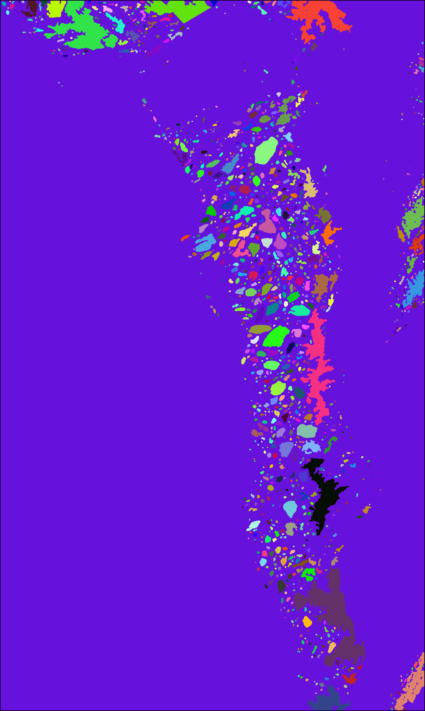

In [405]:
# view_seg_random(cleared_lm)

## Use a watershed transform to separate objects with low solidity

In [406]:
@time begin
props = regionprops_table(cleared_lm.image_indexmap; properties=properties)
props[:, "solidity"] = props.area ./ props.convex_area;
high_solidity_labels = subset(props[:, [:solidity, :label]], [:solidity] => ByRow(r -> r >= 0.85))[:, :label];
low_solidity_labels = subset(props[:, [:solidity, :label]], [:solidity] => ByRow(r -> r < 0.85))[:, :label];

high_solidity = get_subset_by_labels(cleared_lm, high_solidity_labels, falsecolor_image)
low_solidity = get_subset_by_labels(cleared_lm, low_solidity_labels,  falsecolor_image)
end

  9.446391 seconds (193.29 k allocations: 4.411 GiB, 3.47% gc time, 1.02% compilation time)


Segmented Image with:
  labels map: 5680×3392 Matrix{Int64}
  number of labels: 133

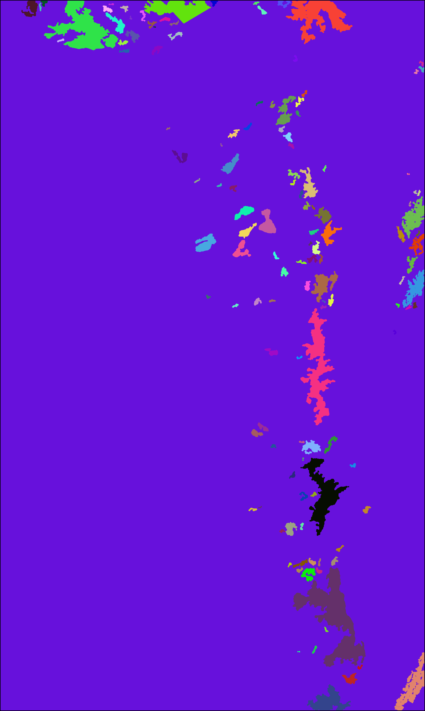

In [407]:
mosaicview(view_seg_random(low_solidity))

In [408]:
function separate_by_watershed(seg; erode_se=strel_box((3,3)), dist_thresh=3)
    new_indexmap = deepcopy(seg.image_indexmap)
    img = view_seg(seg)
    bw = new_indexmap .> 0
    markers = erode(bw, strel_box((3,3)))
    d = bwdist(.!markers)
    cc = label_components(d .> dist_thresh)
    w = Images.watershed(bw, cc)
    lmap = labels_map(w)
    borders = isboundary(lmap) .> 0
    new_indexmap[isboundary(lmap) .> 0] .= 0

    new_indexmap .= label_components(new_indexmap)
    return SegmentedImage(img, new_indexmap)
end

@time begin
    separated_low_solidity = separate_by_watershed(low_solidity)
end
nothing

 18.936059 seconds (129.92 M allocations: 7.544 GiB, 1.99% gc time, 1.19% compilation time)


In [410]:
separated_low_solidity = remove_small_floes(separated_low_solidity, 64)

Segmented Image with:
  labels map: 5680×3392 Matrix{Int64}
  number of labels: 196

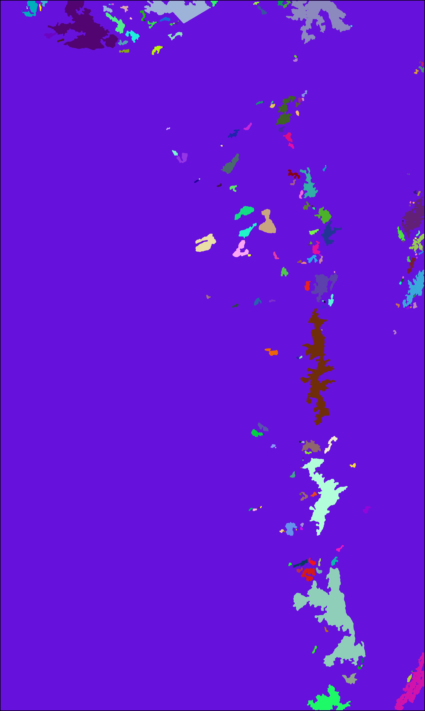

In [411]:
mosaicview(view_seg_random(separated_low_solidity))

In [413]:
props = regionprops_table(separated_low_solidity.image_indexmap; properties=properties)
props[:, "solidity"] = props.area ./ props.convex_area;
high_solidity_labels = subset(props[:, [:solidity, :label]], [:solidity] => ByRow(r -> r >= 0.85))[:, :label];
watershed_high_solidity = get_subset_by_labels(separated_low_solidity, high_solidity_labels, falsecolor_image)
# low_solidity = get_subset_by_labels(cleared_lm, low_solidity_labels,  falsecolor_image)


Segmented Image with:
  labels map: 5680×3392 Matrix{Int64}
  number of labels: 93

In [416]:
# combine for final segmented image
final_labels = label_components(high_solidity.image_indexmap)
watershed_labels = maximum(final_labels) .+ label_components(watershed_high_solidity.image_indexmap)
final_labels .= final_labels .+ watershed_labels
final_segments = SegmentedImage(falsecolor_image, final_labels)


Segmented Image with:
  labels map: 5680×3392 Matrix{Int64}
  number of labels: 1144

In [420]:
cm = Watkins2025CloudMask()
cloud_mask_updated = cm(falsecolor_image);

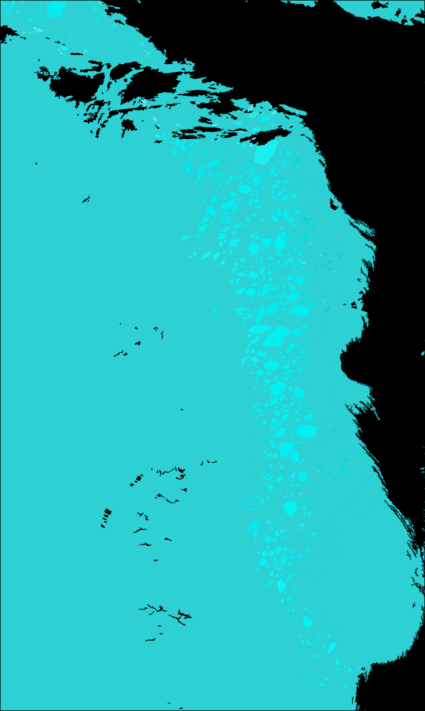

In [421]:
S = view_seg(final_segments)
S .= S .* (final_segments.image_indexmap .> 0)
S .= apply_cloudmask(S, cloud_mask_updated)
S

In [4]:
@info "building landmask"
landmask_imgs = create_landmask(landmask_image, p.landmask_structuring_element)
end

[ Info: building landmask


  2.856945 seconds (6.97 M allocations: 1.795 GiB, 1.90% gc time, 52.87% compilation time)


(dilated = Bool[0 0 … 1 1; 0 0 … 1 1; … ; 1 1 … 0 0; 1 1 … 0 0], non_dilated = Bool[0 0 … 1 1; 0 0 … 1 1; … ; 1 1 … 0 0; 1 1 … 0 0])

In [5]:
@time begin 
@info "Building cloudmask"
# TODO: @hollandjg track down why the cloudmask is different for float32 vs float64 input images
cloudmask = create_cloudmask(falsecolor_image, p.cloud_mask_algorithm)

@info "Preprocessing truecolor image"
# nonlinear diffusion
apply_landmask!(truecolor_image, landmask_imgs.non_dilated)
sharpened_truecolor_image = IceFloeTracker.nonlinear_diffusion( # check if nonlinear_diffusion gets exported
    truecolor_image, p.diffusion_algorithm
)
end
nothing

[ Info: Building cloudmask
[ Info: Preprocessing truecolor image


 19.878921 seconds (6.48 M allocations: 46.427 GiB, 22.38% gc time, 6.40% compilation time)


In [6]:
@time begin
    function f_eq(img)
        return adjust_histogram(
            img,
            AdaptiveEqualization(;
                nbins=p.adapthisteq_params.nbins,
                rblocks=p.adapthisteq_params.rblocks,
                cblocks=p.adapthisteq_params.cblocks,
                minval=minimum(img),
                maxval=maximum(img),
                clip=p.adapthisteq_params.clip,
            ),
        )
    end

    function apply_to_channels(img, f)
    _view = channelview(img)
    _result = [f(@view(_view[i, :, :])) for i in 1:3]
        return colorview(eltype(img), _result...) 
    end
    
    # If we don't need the color channels of the sharpened truecolor it can get dropped
    sharpened_truecolor_image .= apply_to_channels(sharpened_truecolor_image, f_eq)
    sharpened_grayscale_image = unsharp_mask(
        Gray.(sharpened_truecolor_image),
        p.unsharp_mask_params.smoothing_param,
        p.unsharp_mask_params.intensity,
    )
    apply_landmask!(sharpened_grayscale_image, landmask_imgs.dilated)
end

  5.411107 seconds (8.02 M allocations: 4.771 GiB, 14.29% gc time, 24.81% compilation time)


[ Info: Grayscale reconstruction of sharpened image
[ Info: Discriminating ice/water


  4.025180 seconds (10.88 M allocations: 2.647 GiB, 7.46% gc time, 66.59% compilation time)


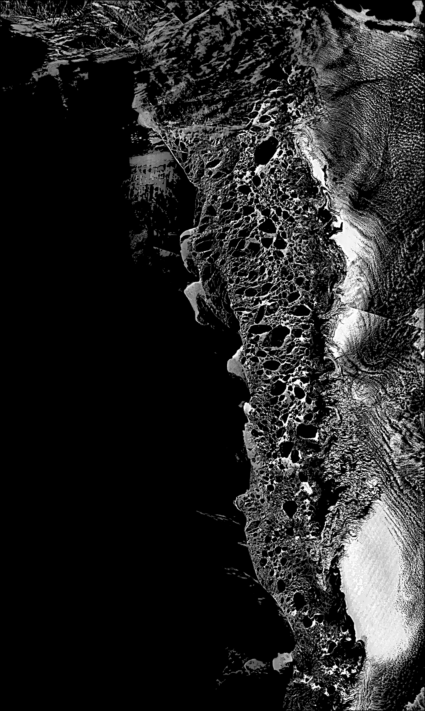

In [7]:
@time begin
    @info "Grayscale reconstruction of sharpened image"
    # input may need to be Gray.(sharpened_truecolor_image) in case the landmask dilation matters
    markers = complement.(dilate(sharpened_grayscale_image, p.reconstruct_strel))
    mask = complement.(sharpened_grayscale_image)
    # reconstruction of the complement: floes are dark, leads are bright
    reconstructed_grayscale = mreconstruct(dilate, markers, mask)
    apply_landmask!(reconstructed_grayscale, landmask_imgs.dilated)    
    # Discriminate ice/water
    @info "Discriminating ice/water"
    ice_water_discrim = LopezAcosta2019.discriminate_ice_water(
        falsecolor_image, reconstructed_grayscale, copy(landmask_imgs.dilated), cloudmask
    )
end

## Segmentation A refactor
1. `find_ice_labels` <= first nonzero algorithm; adjust this to have a minimum number of pixels, and test whether the performance is better or worse if we start with the peaks function rather than going there after three tries.
2. `segmented_ice_cloudmasking` <= separate the kmeans_segmentation function (this should only do the clustering) from the binarization function, which uses the find ice labels result to make a black and white image. And test whether the k-means should happen before or after the cloud masking. In any case, use apply_cloudmask instead, so that we can be more adaptable in the future.
3. `segmentation_A` <= this is a morphological operation that will take some thought to explain. It's area opening, hbreak, branch/bridge, fill_holes, and then the return is the original image with the "diff matrix" set to 1's. I've temporarily replaced it with a function `clean_binary_floes` below.

In [ ]:
function segmented_ice_cloudmasking(
    gray_image::Matrix{Gray{Float64}},
    cloudmask::BitMatrix,
    ice_labels::Union{Vector{Int64},BitMatrix,AbstractArray{<:Gray}},
)::BitMatrix
    segmented_ice = kmeans_segmentation(gray_image, ice_labels)
    segmented_ice_cloudmasked = deepcopy(segmented_ice)
    segmented_ice_cloudmasked[cloudmask] .= 0
    return segmented_ice_cloudmasked
end

In [40]:
?Images.kmeans

```
kmeans(X, k, [...]) -> KmeansResult
```

K-means clustering of the $d×n$ data matrix `X` (each column of `X` is a $d$-dimensional data point) into `k` clusters.

# Arguments

  * `init` (defaults to `:kmpp`): how cluster seeds should be initialized, could be one of the following:

      * a `Symbol`, the name of a seeding algorithm (see [Seeding](@ref) for a list of supported methods);
      * an instance of [`SeedingAlgorithm`](@ref);
      * an integer vector of length $k$ that provides the indices of points to use as initial seeds.
  * `weights`: $n$-element vector of point weights (the cluster centers are the weighted means of cluster members)
  * `maxiter`, `tol`, `display`: see [common options](@ref common_options)


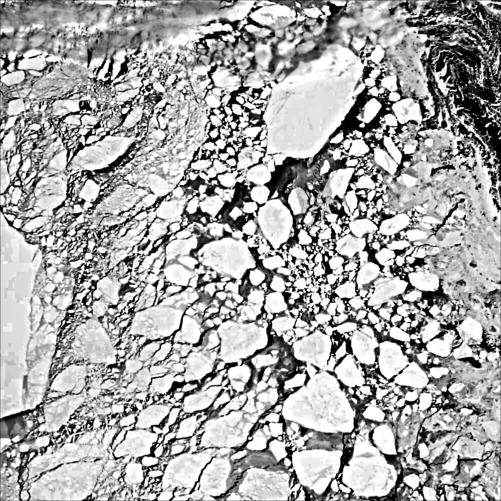

In [41]:
test_img = sharpened_grayscale_image[test_region...]

In [50]:
kmean_segments = kmeans_segmentation(
                        sharpened_grayscale_image[test_region...];
                        k=4, maxiter=50, random_seed=42);

In [52]:
kmean_segments

1001×1001 Matrix{Int64}:
 1  1  1  1  1  1  1  1  4  3  3  1  1  …  2  2  2  2  3  3  2  2  2  2  2  2
 1  1  1  1  1  1  1  1  4  3  3  1  1     2  2  2  2  3  3  2  2  2  2  2  2
 1  1  1  1  1  1  1  1  4  3  3  4  1     2  3  3  3  3  3  2  2  2  2  2  3
 1  1  1  1  1  1  1  4  4  3  3  4  4     4  4  4  4  4  3  3  3  2  4  1  1
 1  1  1  1  1  1  1  3  2  3  3  4  4     1  1  1  1  1  1  1  1  1  1  1  1
 1  1  1  1  1  1  4  2  2  3  4  4  4  …  1  1  1  1  1  1  1  1  1  1  1  1
 4  4  3  3  2  2  2  2  2  2  3  4  4     4  1  1  1  1  1  1  1  1  1  1  1
 3  3  3  2  2  2  2  2  2  2  3  3  3     2  2  2  2  3  4  1  1  1  1  1  1
 3  3  3  2  2  2  2  2  2  2  3  3  3     2  2  2  2  2  2  3  4  1  1  1  1
 3  3  3  2  2  2  2  2  2  3  3  3  3     2  2  2  2  2  2  2  2  2  3  4  4
 3  3  3  3  2  2  2  2  2  3  3  3  3  …  2  2  2  2  2  2  2  2  2  2  3  3
 3  3  3  3  2  2  2  2  3  3  3  3  3     2  2  2  2  2  2  2  2  2  2  2  2
 3  3  3  3  2  2  2  2  2  3  3  3  3 

In [ ]:
# This is the cleanup section from Segmentation A
using Images: area_opening

function clean_binary_floes(bw_img; min_opening_area=50)
    img_opened = area_opening(
        bw_img; min_area=min_opening_area
    ) |> hbreak
    img_filled = branch(img_opened) |> bridge |> fill_holes
    diff_matrix = img_opened .!= img_filled
    return bw_img .|| diff_matrix
end

In [300]:
# segA = clean_binary_floes(complement.(ice_water_discrim) .> 0.3);
size(truecolor_image)

(5680, 3392)

In [350]:
test_region = (1000:4000, 1200:3200);

In [306]:
using StatsBase 

function kmeans_segmentation1(
    gray_image::AbstractArray{<:AbstractGray}; 
    k::Int64=4,
    maxiter::Int64=50,
    random_seed::Int64=45
)
    Random.seed!(random_seed)

    feature_classes = Clustering.kmeans(
        vec(gray_image), k; maxiter=maxiter, display=:none, init=:kmpp
    )

    class_assignments = assignments(feature_classes)

    segmented = reshape(class_assignments, size(gray_image))

    return SegmentedImage(gray_image, segmented)
end

function kmeans_binarization(
    gray_image,
    falsecolor_image;
    k::Int64=4,
    maxiter::Int64=50,
    random_seed::Int64=45,
    ice_labels_algorithm=IceDetectionLopezAcosta2019()
)

    ice_labels = ice_labels_algorithm(falsecolor_image) .> 0
    isempty(ice_labels) && return falses(size(gray_image))

    segmented = kmeans_segmentation1(gray_image; k=k, maxiter=maxiter, random_seed=random_seed)
    
    return segmented.image_indexmap .== StatsBase.mode(segmented.image_indexmap[ice_labels])
end

kmeans_binarization (generic function with 1 method)

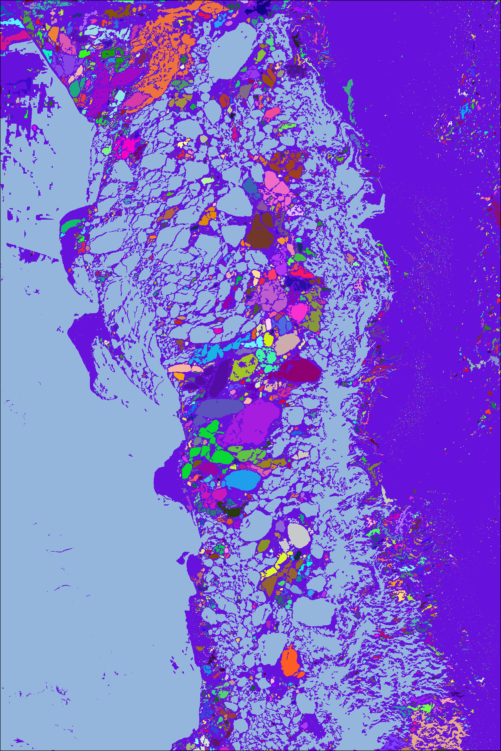

In [356]:
kresults1 = label_components(kmeans_binarization(apply_cloudmask(complement.(ice_water_discrim[test_region...]), cloudmask[test_region...]),
        apply_landmask(falsecolor_image[test_region...], landmask_imgs.dilated[test_region...])))
test = SegmentedImage(falsecolor_image[test_region...], kresults1)
view_seg_random(test)

Something to consider for an alternative processing pathway. The k-means binarization seems pretty good in a lot of cases. The "segmentation A" morphological cleanup seems like it is sometimes effective but not always -- perhaps too agressive in filling holes.

We could use an iterative procedure with the next steps, with some thresholds on the floe measurements. 
1. Filter out the labels that are smaller than `min_floe_area`.
2. Set aside the remaining objects with sufficiently high solidity.
3. Take the remaining floes
   - Convert to binary mask
   - Impose watershed boundaries with some separation (e.g., markers based on erosion by X)
   - Label shapes
4. Clean shapes, e.g. based on 


In [357]:
min_floe_area = 64
for s in segment_labels(test)
    if segment_pixel_count(test, s) < min_floe_area
        kresults1[kresults1 .== s] .= 0
    end
end

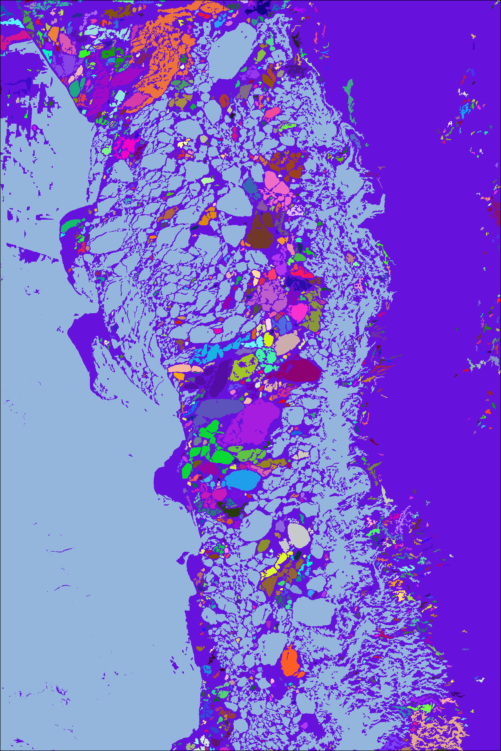

In [358]:
test_removed_small_floes = SegmentedImage(falsecolor_image[test_region...], kresults1)
view_seg_random(test_removed_small_floes)

In [ ]:
properties = ["label", "area", "bbox", "centroid", 
    "convex_area", "major_axis_length", "minor_axis_length", "orientation", "perimeter"]
props = regionprops_table(kresults1; properties=properties)
props[:, "solidity"] = props.area ./ props.convex_area;
high_solidity_labels = subset(props[:, [:solidity, :label]], [:solidity] => ByRow(r -> r >= 0.85))[:, :label];
low_solidity_labels = subset(props[:, [:solidity, :label]], [:solidity] => ByRow(r -> r < 0.85))[:, :label];

In [363]:
function get_subset_by_labels(s, label_list, img)
    idxmap = deepcopy(s.image_indexmap)
    for label in segment_labels(s)
        if label ∉ label_list
            idxmap[idxmap .== label] .= 0
        end
    end
    return SegmentedImage(img, idxmap)
end

props = regionprops_table(kresults1; properties=properties)
props[:, "solidity"] = props.area ./ props.convex_area;
high_solidity_labels = subset(props[:, [:solidity, :label]], [:solidity] => ByRow(r -> r >= 0.85))[:, :label];
low_solidity_labels = subset(props[:, [:solidity, :label]], [:solidity] => ByRow(r -> r < 0.85))[:, :label];

high_solidity = get_subset_by_labels(test_removed_small_floes, high_solidity_labels, falsecolor_image[test_region...])
low_solidity = get_subset_by_labels(test_removed_small_floes, low_solidity_labels,  falsecolor_image[test_region...])

Segmented Image with:
  labels map: 3001×2001 Matrix{Int64}
  number of labels: 951

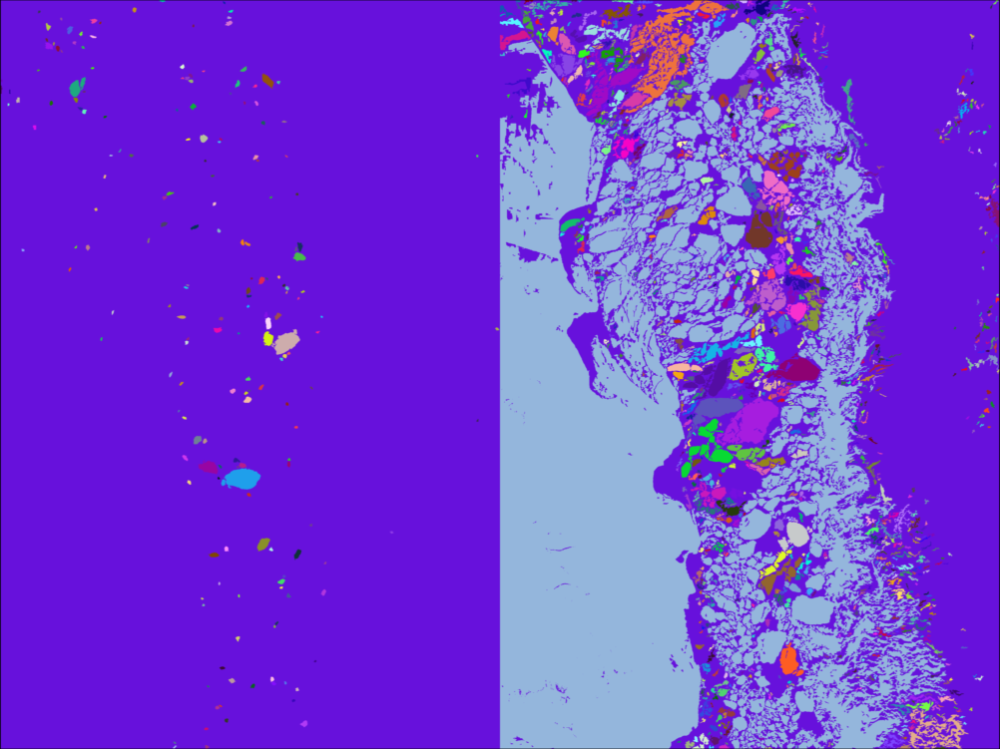

In [364]:
mosaicview(view_seg_random(high_solidity), view_seg_random(low_solidity), nrow=1)

In [316]:
# test with large floes first

function bwdist(bwimg::AbstractArray{Bool})::AbstractArray{Float64}
    return distance_transform(feature_transform(bwimg))
end

# One by one is slow!
# @time begin
# kresults_post_watershed = deepcopy(kresults1)
# for label in low_solidity_labels
#     if segment_pixel_count(test_removed_small_floes, label) > 1000
#         bw = kresults1 .== label
#         markers = erode(bw, strel_box((3,3)))
#         d = bwdist(.!markers)
#         cc = label_components(d .> 3)
#         w = Images.watershed(bw, cc)
#         lmap = labels_map(w)
#         borders = isboundary(lmap) .> 0;
#         kresults_post_watershed[isboundary(lmap) .> 0] .= 0
#     end
# end
# end
# nothing

 30.785854 seconds (279.29 M allocations: 13.036 GiB, 2.31% gc time, 0.02% compilation time)


In [365]:
# alternate:
@time begin
new_indexmap = deepcopy(low_solidity.image_indexmap)
bw = new_indexmap .> 0
markers = erode(bw, strel_box((3,3)))
d = bwdist(.!markers)
cc = label_components(d .> 3)
w = Images.watershed(bw, cc)
lmap = labels_map(w)
borders = isboundary(lmap) .> 0
new_indexmap[isboundary(lmap) .> 0] .= 0
end
nothing

  4.256586 seconds (27.32 M allocations: 1.762 GiB, 2.03% gc time)


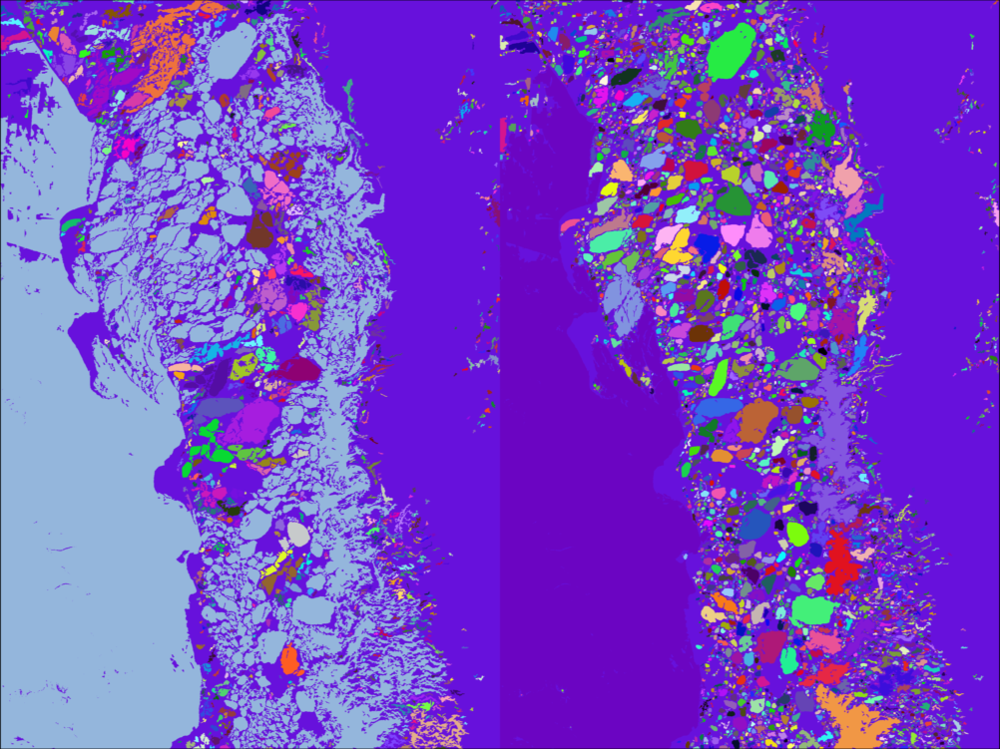

In [366]:
# First pass!
new_seg = SegmentedImage(falsecolor_image[test_region...], label_components(new_indexmap))
mosaicview(view_seg_random(low_solidity), view_seg_random(new_seg), nrow=1)

In [368]:
props = regionprops_table(new_seg.image_indexmap; properties=properties)
props[:, "solidity"] = props.area ./ props.convex_area;
high_solidity_labels = subset(props[:, [:solidity, :label]], [:solidity] => ByRow(r -> r >= 0.85))[:, :label];
low_solidity_labels = subset(props[:, [:solidity, :label]], [:solidity] => ByRow(r -> r < 0.85))[:, :label];

high_solidity2 = get_subset_by_labels(new_seg, high_solidity_labels, falsecolor_image[test_region...])
low_solidity2 = get_subset_by_labels(new_seg, low_solidity_labels,  falsecolor_image[test_region...])

Segmented Image with:
  labels map: 3001×2001 Matrix{Int64}
  number of labels: 4156

In [369]:
# Second pass!
@time begin
new_indexmap = deepcopy(low_solidity2.image_indexmap)
bw = new_indexmap .> 0
markers = erode(bw, strel_box((5,5)))
d = bwdist(.!markers)
cc = label_components(d .> 3)
w = Images.watershed(bw, cc)
lmap = labels_map(w)
borders = isboundary(lmap) .> 0
new_indexmap[isboundary(lmap) .> 0] .= 0
end
nothing

  4.610145 seconds (30.79 M allocations: 1.770 GiB, 1.94% gc time)


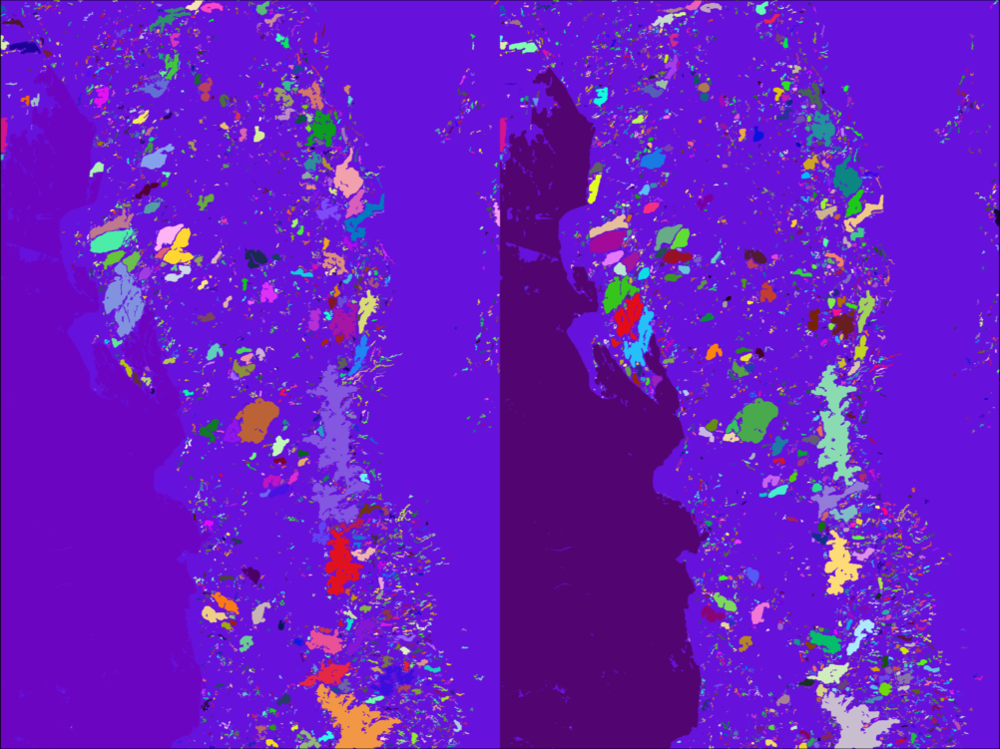

In [371]:
# First pass!
new_seg2 = SegmentedImage(falsecolor_image[test_region...], label_components(new_indexmap))
mosaicview(view_seg_random(low_solidity2), view_seg_random(new_seg2), nrow=1)

In [372]:
first_set_aside = high_solidity.image_indexmap
second_set_aside = high_solidity2.image_indexmap
final_set_aside = new_indexmap

second_set_aside[second_set_aside .> 0] .+ maximum(first_set_aside)
final_set_aside[final_set_aside .> 0] .+ maximum(second_set_aside)

final_floes = label_components(first_set_aside .+ second_set_aside .+ final_set_aside)

post_watershed = SegmentedImage(truecolor_image[test_region...], final_floes)

min_floe_area = 64
for s in segment_labels(post_watershed)
    if segment_pixel_count(post_watershed, s) < min_floe_area
        final_floes[final_floes .== s] .= 0
    end
end

post_watershed = SegmentedImage(truecolor_image[test_region...], label_components(final_floes));

In [375]:
save("../figures/test_new_segmentation.png", view_seg_random(post_watershed))
save("../figures/test_new_truecolor_img.png", truecolor_image[test_region...])

In [317]:
# mosaicview(truecolor_image[test_region...][800:1000, 800:1000], Gray.(kresults_post_watershed .> 0)[800:1000, 800:1000], nrow=1)

In [342]:
test = deepcopy(new_seg.image_indexmap)
post_watershed = SegmentedImage(falsecolor_image[test_region...], test)
min_floe_area = 64
for s in segment_labels(post_watershed)
    if segment_pixel_count(post_watershed, s) < min_floe_area
        test[test .== s] .= 0
    end
end

post_watershed = SegmentedImage(falsecolor_image[test_region...], test);

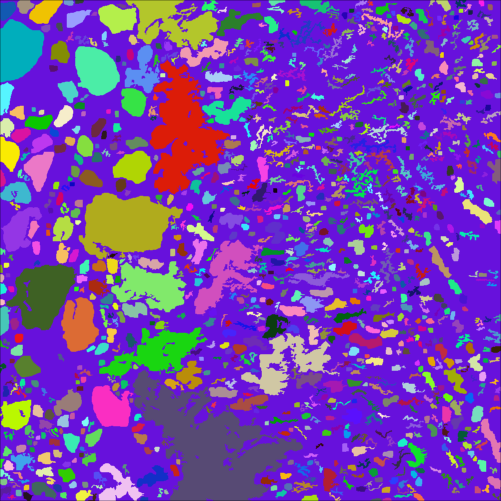

In [320]:
@time begin
    algo = LopezAcosta2019.Segment()
    old_version = algo(truecolor_image[test_region...],
                                      falsecolor_image[test_region...],
                                      landmask_image[test_region...])
end

[ Info: building landmask
[ Info: Building cloudmask
[ Info: Finding ice labels
[ Info: Sharpening truecolor image
[ Info: Normalizing truecolor image
[ Info: Discriminating ice/water
[ Info: Segmenting floes part 1/3
[ Info: Segmenting floes part 2/3
[ Info: Building watersheds
[ Info: Segmenting floes part 3/3
[ Info: Done with k-means segmentation
[ Info: Labeling floes


  4.931803 seconds (7.06 M allocations: 8.474 GiB, 10.63% gc time)


Segmented Image with:
  labels map: 1001×1001 Matrix{Int64}
  number of labels: 195

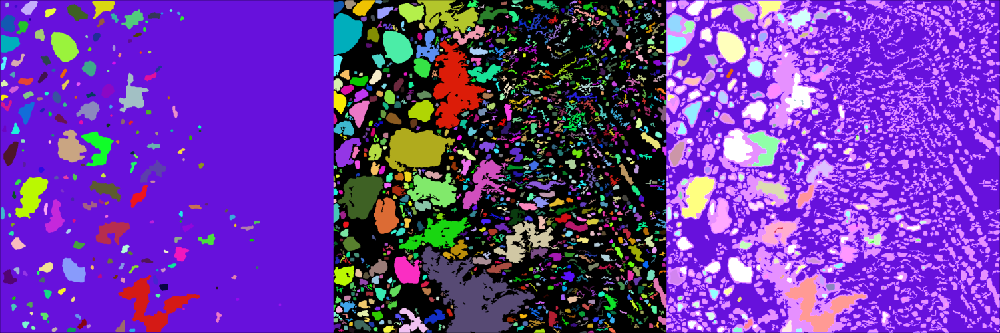

In [344]:
p = float64.(view_seg_random(old_version))
p[post_watershed.image_indexmap .> 0] = (p .+ (0.5 .* Gray.(post_watershed.image_indexmap .> 0)))[post_watershed.image_indexmap .> 0]
pnew =  view_seg_random(post_watershed)
pnew[post_watershed.image_indexmap .== 0] .= 0

mosaicview(view_seg_random(old_version), pnew,
           p, nrow=1)

In [347]:
re_mapped = post_watershed
props = regionprops_table(re_mapped.image_indexmap; properties=properties)
props[:, "solidity"] = props.area ./ props.convex_area;
props[:, "circularity"] = 4 * π * props.area ./ props.perimeter.^2

high_solidity_labels = subset(props[:, [:solidity, :label]], [:solidity] => ByRow(r -> r > 0.8))[:, :label];
high_solidity = get_subset_by_labels(re_mapped, high_solidity_labels, falsecolor_image[test_region...]);

high_circularity_labels = subset(props[:, [:circularity, :label]], [:circularity] => ByRow(r -> r > 0.6))[:, :label];
high_circularity = get_subset_by_labels(re_mapped, high_circularity_labels, falsecolor_image[test_region...]);

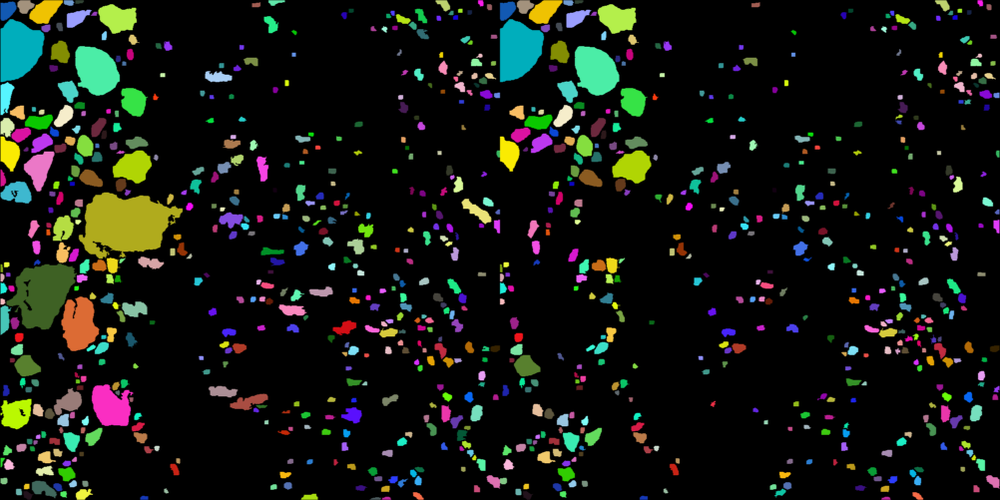

In [348]:
hs =  view_seg_random(high_solidity)
hc = view_seg_random(high_circularity)
hs[high_solidity.image_indexmap .== 0] .= 0
hc[high_circularity.image_indexmap .== 0] .= 0

mosaicview(hs, hc, nrow=1)

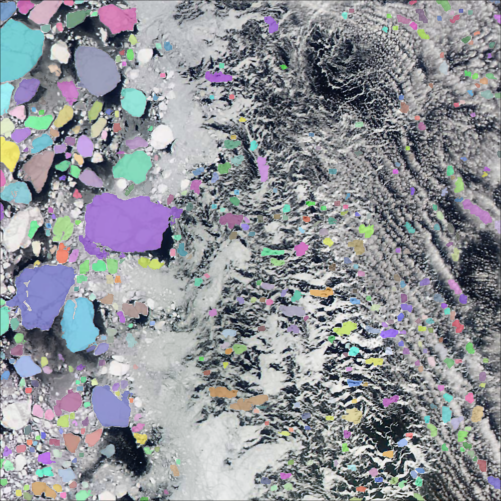

In [332]:
tc_img_hs = deepcopy(truecolor_image[test_region...])
hs_labels = high_solidity.image_indexmap .> 0
tc_img_hs[hs_labels] .= 0.5 .* hs[hs_labels] .+ 0.5 .* tc_img_hs[hs_labels]
tc_img_hs

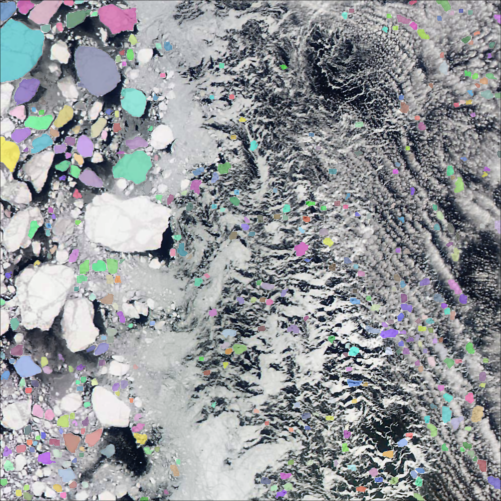

In [333]:
tc_img_hc = deepcopy(truecolor_image[test_region...])
hc_labels = high_circularity.image_indexmap .> 0
tc_img_hc[hc_labels] .= 0.5 .* hc[hc_labels] .+ 0.5 .* tc_img_hc[hc_labels]
tc_img_hc

In [86]:
using Random

# Produce an image by replacing values inside a segment with the segment mean color
function view_seg(s)
    map(i->segment_mean(s,i), labels_map(s))
end
# Return a random color of type RGB{N0f8}
function get_random_color(seed)
    Random.seed!(seed)
    rand(RGB{N0f8})
end

# Assign random colors to each segment (useful if viewing cluster results)
function view_seg_random(s)
    map(i->get_random_color(i), labels_map(s))
end


view_seg_random (generic function with 1 method)

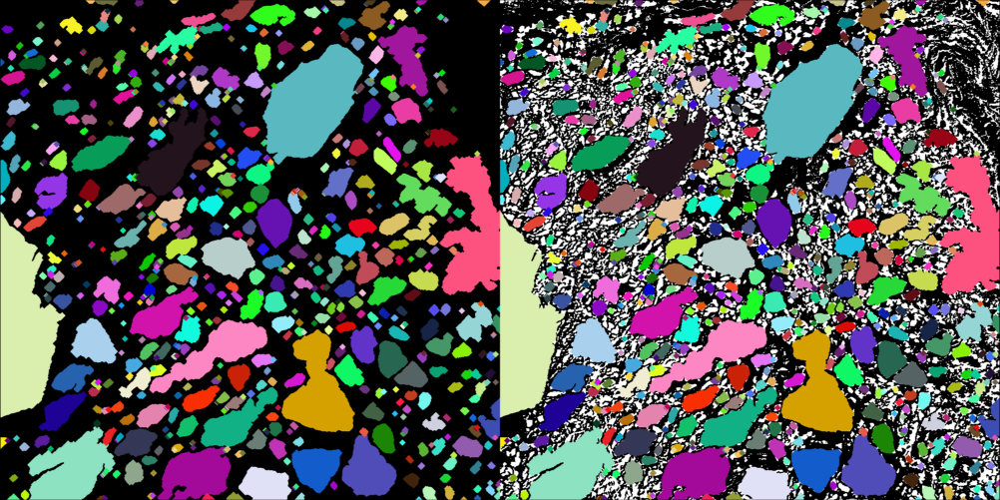

In [87]:
color_markers = view_seg_random(large)
bw = RGB.(deepcopy(segA))
bw[large.image_indexmap .> 0] .= color_markers[large.image_indexmap .> 0]
mosaicview(color_markers .* (large.image_indexmap .> 0), bw, nrow=1)

In [79]:
@time begin
segA = LopezAcosta2019.segmentation_A(test .> 0);
end
nothing

  0.303059 seconds (3.43 M allocations: 259.608 MiB, 6.91% gc time)


In [26]:
# This function does a series of complex
function clean_binary_floes(bw_img; min_opening_area=50)
    img_opened = area_opening(bw_img; min_area=min_opening_area) |> hbreak
    img_filled = branch(img_opened) |> bridge |> fill_holes
    diff_matrix = img_opened .!= img_filled
    return bw_img .|| diff_matrix
end

@time begin
segA_refactor = clean_binary_floes(test .> 0);
end
nothing

  0.394004 seconds (3.56 M allocations: 265.235 MiB, 3.31% gc time, 25.15% compilation time)


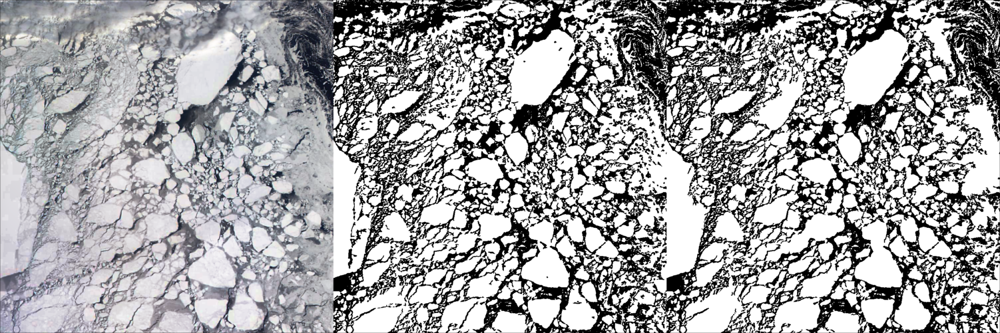

In [27]:
mosaicview(sharpened_truecolor_image[test_region...], Gray.(test), Gray.(segA_refactor), nrow=1)

## Segmentation B refactor
Segmentation B does the following:
1. Take the sharpened grayscale image. Binarize it with a simple threshold of `isolation_threshold` = 0.4.
2. Take all the places larger than that threshold, and multiply them by 0.3.
3. Add this to the original sharpened grayscale image (this is basically the "brighten floes" step).
4. Take this new brightened image, and make a linear combination of the brighened image and the original image.
5. Take the adjusted image, and apply gamma correction with gamma = 2.5.
6. Apply the cloud mask to this image.
7. Binarize the image using the "adjusted_ice_threshold"
8. Apply imfill with fill range (0, 1) to the binarized image. This should probably be the output!
9. Take the result of segmentation A, close it using a diamond strel, multiply by segb_ice_filled

In [35]:
function segmentation_B(
    sharpened_image::Matrix{Gray{Float64}},
    cloudmask::BitMatrix,
    segmented_a_ice_mask::BitMatrix,
    struct_elem=strel_diamond((3, 3));
    fill_range::Tuple=(0, 1),
    isolation_threshold::Float64=0.4,
    alpha_level::Float64=0.5,
    gamma_factor::Float64=2.5,
    adjusted_ice_threshold::Float64=0.05,
)

    ## Process sharpened image
    not_ice_mask = deepcopy(sharpened_image)
    not_ice_mask[not_ice_mask .< isolation_threshold] .= 0
    not_ice_bit = not_ice_mask .* 0.3
    not_ice_mask .= not_ice_bit .+ sharpened_image
    adjusted_sharpened = (
        (1 - alpha_level) .* sharpened_image .+ alpha_level .* not_ice_mask
    )
    gamma_adjusted_sharpened = adjust_histogram(
        adjusted_sharpened, GammaCorrection(; gamma=gamma_factor)
    )
    gamma_adjusted_sharpened_cloudmasked = apply_cloudmask(
        gamma_adjusted_sharpened, cloudmask
    )
    segb_filled =
        .!imfill(
            gamma_adjusted_sharpened_cloudmasked .<= adjusted_ice_threshold, fill_range
        )

    ## Process ice mask
    segb_ice = closing(segmented_a_ice_mask, struct_elem) .* segb_filled

    # ice_intersect = (segb_filled .* segb_ice) # dmw: this will not change anything, will it? segb is binary, we're multiplying twice.

    return (;
        :not_ice => map(clamp01nan, not_ice_mask)::Matrix{Gray{Float64}}, # Why this and not the segb_filled?
        :not_ice_bit => (not_ice_bit .> 0)::BitMatrix, # Useless complication. We can binarize later if necessary.
        :ice_intersect => segb_ice #::BitMatrix, # This is the combination with segA, which should be out in the open
    )
end

segmentation_B (generic function with 2 methods)

In [34]:
test_1 = segmentation_B(sharpened_grayscale_image, cloudmask, segA);

In [36]:
test_2 = segmentation_B(sharpened_grayscale_image, cloudmask, segA);

In [11]:
# 2. Intermediate images
@info "Finding bright ice pixels"
# TODO: Update find_ice_mask to include changing settings
ice_mask = find_ice_mask(falsecolor_image, landmask_imgs.dilated);

[ Info: Finding bright ice pixels


In [14]:
@time begin
# 3. Segmentation
    @info "Segmenting floes part 1/3"
    # Components: 
    # - k-means binarization
    # - morphological cleanup
    segA = LopezAcosta2019.segmentation_A(
        LopezAcosta2019.segmented_ice_cloudmasking(ice_water_discrim, cloudmask, ice_mask)
    )
    
    # segmentation_B
    @info "Segmenting floes part 2/3"
    segB = LopezAcosta2019.segmentation_B(sharpened_grayscale_image, cloudmask, segA)
end

[ Info: Segmenting floes part 1/3
[ Info: Segmenting floes part 2/3


 17.341365 seconds (78.12 M allocations: 11.531 GiB, 5.02% gc time, 12.45% compilation time)


(not_ice = Gray{Float64}[Gray{Float64}(1.0) Gray{Float64}(1.0) … Gray{Float64}(0.0) Gray{Float64}(0.0); Gray{Float64}(1.0) Gray{Float64}(1.0) … Gray{Float64}(0.0) Gray{Float64}(0.0); … ; Gray{Float64}(0.0) Gray{Float64}(0.0) … Gray{Float64}(0.8674712001584386) Gray{Float64}(0.9224935061347215); Gray{Float64}(0.0) Gray{Float64}(0.0) … Gray{Float64}(0.8962638931473502) Gray{Float64}(0.9512527886366238)], not_ice_bit = Bool[1 1 … 0 0; 1 1 … 0 0; … ; 0 0 … 1 1; 0 0 … 1 1], ice_intersect = Bool[1 1 … 0 0; 1 1 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0])

In [15]:
@time begin
@info "Building watersheds"
watersheds_segB = [
    LopezAcosta2019.watershed_ice_floes(segB.not_ice_bit), LopezAcosta2019.watershed_ice_floes(segB.ice_intersect)
]
watersheds_segB_product = LopezAcosta2019.watershed_product(watersheds_segB...)
end

[ Info: Building watersheds


1180.502841 seconds (72.02 k allocations: 709.365 GiB, 1.12% gc time, 0.01% compilation time)


5680×3392 BitMatrix:
 0  0  0  0  0  0  0  0  0  0  0  0  0  …  0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0  …  0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0  …  0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     

In [16]:
@time begin
# segmentation_F
# TODO: @hollandjg find out why segF is more dilated
@info "Segmenting floes part 3/3"
segF = segmentation_F(
    segB.not_ice,
    segB.ice_intersect,
    watersheds_segB_product,
    ice_mask,
    cloudmask,
    landmask_imgs.dilated,
)

@info "Labeling floes"
labels = label_components(segF)

# Return the original truecolor image, segmented
segments = SegmentedImage(truecolor, labels)
end

[ Info: Segmenting floes part 3/3


LoadError: UndefVarError: `segmentation_F` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [ ]:
@time begin
    older_result = older_seg(tc_img, fc_img, lm_img) # fully running defaults here!
end

seg_img = view_seg_random(older_result)
overlay_img = deepcopy(Gray.(tc_img))
overlay_img[older_result.image_indexmap .> 0] .= 0
seg_img[older_result.image_indexmap .== 0] .= 0
save("../../20140427.aqua.segmented.png", mosaicview( seg_img .+ overlay_img))